In [6]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib 
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure
%matplotlib inline 


In [7]:
df=pd.read_csv('movies.csv')
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [8]:
#let's see if there is any missing data
for col in df.columns :
    pct_missing=np.mean(df[col].isnull())
    pct_sum=np.sum(df[col].isnull())
    print('{} - {}%'.format(col,pct_missing),"sum: ", pct_sum )
    

name - 0.0% sum:  0
rating - 0.010041731872717789% sum:  77
genre - 0.0% sum:  0
year - 0.0% sum:  0
released - 0.0002608242044861763% sum:  2
score - 0.0003912363067292645% sum:  3
votes - 0.0003912363067292645% sum:  3
director - 0.0% sum:  0
writer - 0.0003912363067292645% sum:  3
star - 0.00013041210224308815% sum:  1
country - 0.0003912363067292645% sum:  3
budget - 0.2831246739697444% sum:  2171
gross - 0.02464788732394366% sum:  189
company - 0.002217005738132499% sum:  17
runtime - 0.0005216484089723526% sum:  4


In [5]:
#data type for our columns
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [9]:
#change data type and cleaning the NAN value
df.dropna(subset=['budget'], inplace = True)
df['budget']=df['budget'].astype('int64',True,'raise')
df.dropna(subset=['gross'], inplace = True)
df['gross']=df['gross'].astype('int64',True,'raise')

Update the column year by the correct value with the released column

In [10]:
ser=[]

for i in df['released']:
    k= i[i.find(',')+1:i.find(',')+6]
    ser.append(k)


In [11]:
#append the ser list to the year column to correct the year 

i=0
for col in  df['year']:
   if ser[i]==str(col):
       df[col]=int(ser[i])
       i=i+1
   else :
        i=+1
        continue


In [12]:
#test
s=0
for col ,ycol in zip(ser,df['year']):
    if str(col[col.find(',')+2:col.find(',')+6] )== str(ycol):
          print(col[col.find(',')+1:col.find(',')+6],ycol,len(col[col.find(',')+2:col.find(',')+6]),len(str(ycol)))
          
    elif col[col.find(',')+2:col.find(',')+6]!= str(ycol):
        x=col[col.find(',')+2:col.find(',')+6]
        df[ycol]=int(x)
        
        print("err",col[col.find(',')+1:col.find(',')+6],df[ycol])
       
      

 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
err  1981 0       1981
1       1981
2       1981
3       1981
4       1981
        ... 
7648    1981
7649    1981
7650    1981
7651    1981
7652    1981
Name: 1980, Length: 5436, dtype: int64
 1980 1980 4 4
 1980 1980 4 4
err  1984 0       1984
1       1984
2       1984
3       1984
4       1984
        ... 
7648    1984
7649    1984
7650    1984
7651    1984
7652    1984
Name: 1980, Length: 5436, dtype: int64
 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
err  1981 0       1981
1       1981
2       1981
3       1981
4       1981
        ... 
7648    1981
7649    1981
7650    1981
7651    1981
7652    1981
Name: 1980, Length: 5436, dtype: int64
 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
 1980 1980 4 4
err  1981 0       1981
1       1981
2       1981
3       1981
4       1981
        ... 
7648    1981
7649    

ValueError: invalid literal for int() with base 10: 'ugus'

In [13]:
s=0
f=0
for col ,ycol in zip(ser,df['year']):
    if str(col[col.find(',')+2:col.find(',')+6] )== str(ycol):
          s=s+1
          
    elif col[col.find(',')+2:col.find(',')+6]!= str(ycol):
        f=f+1
print(s ,f)

4715 721


In [14]:
pd.set_option('display.max_rows',None)

In [15]:
#drop any duplicates
df['company'].drop_duplicates().sort_values(ascending=False)

7129                                              thefyzz
5664                                          micro_scope
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
3330                          Zucker Brothers Productions
146                                      Zoetrope Studios
2213                                   Zeta Entertainment
3698                              Zentropa Entertainments
1180                                 Zenith Entertainment
5180                                      Zazen Produções
1321                             Zanuck/Brown Productions
1329                          Zacharias-Buhai Productions
789                             Young Sung Production Co.
5125                           Young Hannibal Productions
5499                                          Yellow Bird
4618          

In [17]:
#sort the data
df.sort_values(by=['gross'],inplace=False,ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,1980,1981,1982,1983
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,1981,1982,982,1984
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,1981,1982,982,1984
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1981,1982,982,1984
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,1981,1982,982,1984
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,1981,1982,982,1984
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,1981,1982,982,1984
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,1981,1982,982,1984
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,1981,1982,982,1984
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,1981,1982,982,1984
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,1981,1982,982,1984


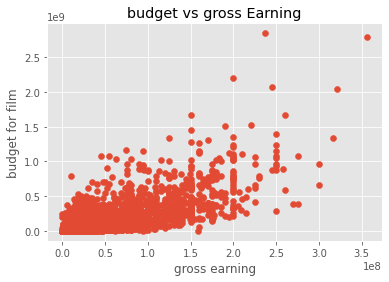

In [18]:
#scatter plot with budget vs gross
plt.scatter(x=df['budget'],y=df['gross'])
plt.title('budget vs gross Earning')
plt.xlabel('gross earning')
plt.ylabel('budget for film')
plt.show()

<AxesSubplot:xlabel='budget', ylabel='gross'>

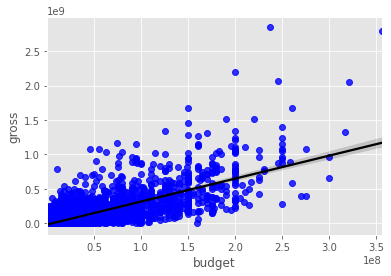

In [19]:
#plot the budget vs gross using seaborn 
sns.regplot(x='budget',y='gross',data=df,scatter_kws={"color":"blue"},line_kws={"color":"black"})

In [20]:
#looking for correlation
# pearson , kendall , spearman method u can use in the corr function 
df.corr(method='kendall')

,year,score,votes,budget,gross,runtime,1980,1981,1982,1983
year,1.000000,0.038391,0.295884,0.220991,0.239313,0.064106,NaN,NaN,NaN,NaN
score,0.038391,1.000000,0.350111,-0.006518,0.124715,0.292872,NaN,NaN,NaN,NaN
votes,0.295884,0.350111,1.000000,0.346228,0.553640,0.205616,NaN,NaN,NaN,NaN
budget,0.220991,-0.006518,0.346228,1.000000,0.512637,0.230879,NaN,NaN,NaN,NaN
gross,0.239313,0.124715,0.553640,0.512637,1.000000,0.176825,NaN,NaN,NaN,NaN
runtime,0.064106,0.292872,0.205616,0.230879,0.176825,1.000000,NaN,NaN,NaN,NaN
1980,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
1981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
1982,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
1983,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


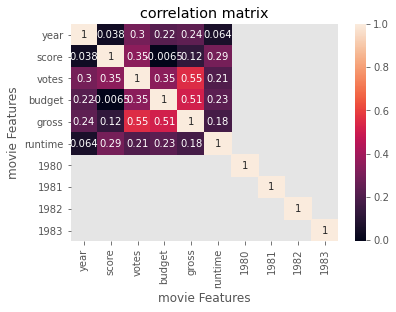

In [21]:
crrelation_matrix= df.corr(method='kendall')
sns.heatmap( crrelation_matrix, annot =True)
plt.title('correlation matrix')
plt.xlabel('movie Features')
plt.ylabel('movie Features')
plt.show()

In [ ]:
#looking at company 
df.head()

In [22]:
df_numerized=df
for col in df_numerized.columns:
    if(df_numerized[col].dtype=='object'):
        df_numerized[col]=df_numerized[col].astype('category')
        df_numerized[col]=df_numerized[col].cat.codes
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,1980,1981,1982,1983
0,4706,6,6,1980,1308,8.4,927000.0,1800,2841,700,46,19000000,46998772,1432,146.0,1981,1982,982,1984
1,3943,6,1,1980,1131,5.8,65000.0,1581,1160,215,47,4500000,58853106,454,104.0,1981,1982,982,1984
2,3654,4,0,1980,1363,8.7,1200000.0,759,1822,1161,47,18000000,538375067,949,124.0,1981,1982,982,1984
3,205,4,4,1980,1131,7.7,221000.0,891,1416,1478,47,3500000,83453539,1114,88.0,1981,1982,982,1984
4,734,6,4,1980,1174,7.3,108000.0,721,352,272,47,6000000,39846344,1089,98.0,1981,1982,982,1984
5,1513,6,9,1980,1928,6.4,123000.0,1763,3091,156,47,550000,39754601,1114,95.0,1981,1982,982,1984
6,3944,6,0,1980,1363,7.9,188000.0,976,578,861,47,27000000,115229890,1403,133.0,1981,1982,982,1984
7,3134,6,3,1980,531,8.2,330000.0,1272,1259,1473,47,18000000,23402427,392,129.0,1981,1982,982,1984
8,3745,4,0,1980,1350,6.8,101000.0,1611,1405,596,47,54000000,108185706,550,127.0,1981,1982,982,1984
9,4415,6,3,1980,1760,7.0,10000.0,2017,281,403,47,10000000,15795189,1397,100.0,1981,1982,982,1984


In [ ]:
df

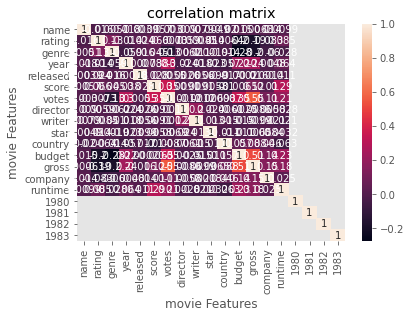

In [24]:
crrelation_matrix= df_numerized.corr(method='kendall')
sns.heatmap( crrelation_matrix, annot =True)
plt.title('correlation matrix')
plt.xlabel('movie Features')
plt.ylabel('movie Features')
plt.show()